# Exercise 4.10 Coding Etiquette & Excel Reporting

## Contents:

#### Importing Libraries and Dataframes

#### Step 2 - Addressing PII Data

#### Step 3a - Creating Regional Segmentation in the Data

#### Step 3b - Determining Difference in Spending Habits Across Regions

#### Step 4 - Creating an Exclusion Flag for Low-Activity Customers

#### Step 5 - Creating Profiling Variables for Customers

#### Step 6 - Creating Visualizations Based on Customer Profiles

#### Step 7 - Creating Aggregates of Variables at the Customer Profile level

#### Step 8 - Comparing Customer Profiles with Regions and Departments

#### Step 9 - Creating Visualizations of Analysis

#### Exporting Visualizations

#### Step 10 - Exporting the Final Dataset

## Importing Libraries and Dataframes

In [1]:
# Import libraries

import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy


In [2]:
# Import dataframes

path = r'C:\Users\jenci\Documents\Data Analytics\Python Fundamentals for Data Analysts\04-2024 Instacart Basket Analysis'
df_ords_prods_cust_merge = pd.read_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'ords_prods_customers_merged.pkl'))

In [3]:
# Check output
pd.set_option('display.max_columns', None)
df_ords_prods_cust_merge.head()

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income,_merge
0,2539329,1,1,2,8,7.0,196.0,1.0,0.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Regularly busy,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,married,40423,both
1,2398795,1,2,3,7,15.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Slowest days,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,married,40423,both
2,473747,1,3,3,12,21.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Slowest days,Most orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,married,40423,both
3,2254736,1,4,4,7,29.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Least busy,Slowest days,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,married,40423,both
4,431534,1,5,4,15,28.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Least busy,Slowest days,Most orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,married,40423,both


In [4]:
# Remove merge flag column

df_ords_prods_cust_merge.drop(columns = ['_merge'], inplace = True)

In [5]:
# Capitalize variable names in fam_status for consistency across dataframe variables

replace_dict = {'married':'Married', 'single':'Single', 'divorced/widowed':'Divorced/Widowed', 'living with parents and siblings':'Living with parents and siblings'}
df_ords_prods_cust_merge['fam_status'] = df_ords_prods_cust_merge['fam_status'].replace(replace_dict)

In [6]:
# Check output

df_ords_prods_cust_merge.head()

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income
0,2539329,1,1,2,8,7.0,196.0,1.0,0.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Regularly busy,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423
1,2398795,1,2,3,7,15.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Slowest days,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423
2,473747,1,3,3,12,21.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Slowest days,Most orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423
3,2254736,1,4,4,7,29.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Least busy,Slowest days,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423
4,431534,1,5,4,15,28.0,196.0,1.0,1.0,Soda,77,7,9.0,Mid-range product,Least busy,Slowest days,Most orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423


In [7]:
# Check shape

df_ords_prods_cust_merge.shape

(32434212, 30)

In [8]:
#Check Values -- When conducting analysis later on in this exercise I noticed there was an error with pricing in the Young Adult & High Income profiles
pd.set_option('display.max_rows', None)
df_ords_prods_cust_merge['prices'].value_counts()

prices
12.3       624300
10.3       510496
4.0        447272
6.3        438467
1.3        425691
7.3        411924
8.2        404015
1.4        392209
6.7        379126
4.5        367223
4.4        357026
6.8        355246
14.3       348208
7.9        342988
13.2       333183
5.7        323997
1.8        321184
9.1        320782
4.9        318220
8.8        318091
3.8        315426
6.9        314196
14.0       311640
12.8       309727
11.4       303015
3.6        300127
1.6        299352
2.0        286259
11.8       284495
5.3        284243
7.0        282884
14.7       279291
6.5        278357
8.3        276230
4.1        268269
2.9        264700
1.2        256276
8.6        254009
3.2        253782
5.2        251509
5.5        250136
3.1        249256
2.5        246421
4.2        245755
6.1        244209
1.1        242782
2.3        242051
5.8        241047
7.5        239261
14.1       238211
3.3        238041
10.5       237657
7.4        233506
9.0        228576
8.4        227493
5.0

In [9]:
# Check variables associated with wrong pricing
filtered_data_1 = df_ords_prods_cust_merge[df_ords_prods_cust_merge['prices'].isin([14900.0, 99999.0])]
filtered_data_1.head(100)

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income
7816,1435153,1519,26,2,11,6.0,21553.0,15.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
7817,1066435,1519,32,3,10,5.0,21553.0,28.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Slowest days,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
15172,1697208,2409,33,1,19,5.0,21553.0,1.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Average orders,48,Loyal customer,35.233761,High spender,5.0,Frequent customer,Female,Hawaii,55,11/11/2018,2,Married,230074
20294,965345,3531,27,2,19,8.0,33664.0,2.0,0.0,2 % Reduced Fat Milk,84,16,99999.0,High-range product,Regularly busy,Regularly busy,Average orders,29,Regular customer,267.469870,High spender,8.0,Frequent customer,Female,Hawaii,80,10/6/2019,2,Married,233776
20528,2943740,3793,1,2,9,7.0,21553.0,3.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,18,Regular customer,71.191102,High spender,7.0,Frequent customer,Male,Louisiana,59,8/23/2019,3,Married,182933
22523,172425,3819,3,1,12,30.0,21553.0,14.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22524,1578338,3819,6,2,13,30.0,21553.0,7.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22525,1197681,3819,7,5,15,24.0,21553.0,8.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22526,2216737,3819,10,5,16,10.0,21553.0,6.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
30477,948005,5218,2,1,0,15.0,21553.0,5.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Fewest orders,19,Regular customer,395.505652,High spender,11.0,Regular customer,Female,Iowa,29,5/23/2017,2,Married,120566


In [10]:
# Try to find alternative pricing for 2 items with incorrect pricing
filtered_data_2 = df_ords_prods_cust_merge[df_ords_prods_cust_merge['product_name'].isin(['Lowfat 2% Milkfat Cottage Cheese', '2% Reduced Fat Milk' ])]
filtered_data_2.head(200)

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income
886,606677,43,1,1,18,7.0,23909.0,4.0,0.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Regularly busy,Busiest days,Average orders,11,Regular customer,7.444898,Low spender,10.0,Frequent customer,Female,Tennessee,41,11/19/2018,1,Married,123723
887,1630444,43,7,0,12,10.0,23909.0,2.0,1.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Busiest day,Busiest days,Most orders,11,Regular customer,7.444898,Low spender,10.0,Frequent customer,Female,Tennessee,41,11/19/2018,1,Married,123723
2480,804056,290,34,0,20,9.0,23909.0,11.0,0.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Busiest day,Busiest days,Average orders,51,Loyal customer,7.285597,Low spender,7.0,Frequent customer,Female,Michigan,24,5/18/2019,1,Married,55550
5033,3232145,642,1,5,18,7.0,23909.0,2.0,0.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Regularly busy,Regularly busy,Average orders,6,New customer,9.289362,Low spender,13.0,Regular customer,Female,Ohio,58,1/21/2019,3,Married,124896
5034,1712835,642,5,5,5,30.0,23909.0,8.0,1.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Regularly busy,Regularly busy,Fewest orders,6,New customer,9.289362,Low spender,13.0,Regular customer,Female,Ohio,58,1/21/2019,3,Married,124896
5035,2504280,642,6,0,11,16.0,23909.0,3.0,1.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Busiest day,Busiest days,Most orders,6,New customer,9.289362,Low spender,13.0,Regular customer,Female,Ohio,58,1/21/2019,3,Married,124896
7571,513685,1487,30,4,15,10.0,23909.0,4.0,0.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Least busy,Slowest days,Most orders,33,Regular customer,7.584058,Low spender,6.0,Frequent customer,Male,Delaware,23,1/30/2019,1,Married,50703
7816,1435153,1519,26,2,11,6.0,21553.0,15.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
7817,1066435,1519,32,3,10,5.0,21553.0,28.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Slowest days,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
9864,2342721,1641,5,1,12,6.0,23909.0,31.0,0.0,2% Reduced Fat Milk,84,16,9.2,Mid-range product,Regularly busy,Busiest days,Most orders,6,New customer,7.869748,Low spender,7.0,Frequent customer,Male,District of Columbia,23,1/23/2017,1,Married,45225


In [11]:
# Find alternative pricing for last item
filtered_data_4 = df_ords_prods_cust_merge[df_ords_prods_cust_merge['product_name'] =='Lowfat 2% Milkfat Cottage Cheese']
filtered_data_4

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income
7816,1435153,1519,26,2,11,6.0,21553.0,15.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
7817,1066435,1519,32,3,10,5.0,21553.0,28.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Slowest days,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Male,Rhode Island,68,3/4/2020,0,Divorced/Widowed,177864
15172,1697208,2409,33,1,19,5.0,21553.0,1.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Average orders,48,Loyal customer,35.233761,High spender,5.0,Frequent customer,Female,Hawaii,55,11/11/2018,2,Married,230074
20528,2943740,3793,1,2,9,7.0,21553.0,3.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,18,Regular customer,71.191102,High spender,7.0,Frequent customer,Male,Louisiana,59,8/23/2019,3,Married,182933
22523,172425,3819,3,1,12,30.0,21553.0,14.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22524,1578338,3819,6,2,13,30.0,21553.0,7.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22525,1197681,3819,7,5,15,24.0,21553.0,8.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
22526,2216737,3819,10,5,16,10.0,21553.0,6.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Male,Utah,69,1/26/2020,2,Married,129749
30477,948005,5218,2,1,0,15.0,21553.0,5.0,0.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Busiest days,Fewest orders,19,Regular customer,395.505652,High spender,11.0,Regular customer,Female,Iowa,29,5/23/2017,2,Married,120566
30478,3022134,5218,7,6,14,13.0,21553.0,2.0,1.0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,19,Regular customer,395.505652,High spender,11.0,Regular customer,Female,Iowa,29,5/23/2017,2,Married,120566


In [12]:
# Replace all items priced 99999.0 with 9.2 and drop all rows where prices are 14900.0

df_ords_prods_cust_merge['prices'] = df_ords_prods_cust_merge['prices'].replace(99999.0, 9.2)
df_ords_prods_cust_merge = df_ords_prods_cust_merge.drop(df_ords_prods_cust_merge[df_ords_prods_cust_merge['prices'] == 14900.0].index)

In [13]:
# Check output
df_ords_prods_cust_merge['prices'].value_counts()

prices
12.3    624300
10.3    510496
4.0     447272
6.3     438467
1.3     425691
7.3     411924
8.2     404015
1.4     392209
6.7     379126
4.5     367223
4.4     357026
6.8     355246
14.3    348208
7.9     342988
13.2    333183
5.7     323997
1.8     321184
9.1     320782
4.9     318220
8.8     318091
3.8     315426
6.9     314196
14.0    311640
12.8    309727
11.4    303015
3.6     300127
1.6     299352
2.0     286259
11.8    284495
5.3     284243
7.0     282884
14.7    279291
6.5     278357
8.3     276230
4.1     268269
2.9     264700
1.2     256276
8.6     254009
3.2     253782
5.2     251509
5.5     250136
3.1     249256
2.5     246421
4.2     245755
6.1     244209
1.1     242782
2.3     242051
5.8     241047
7.5     239261
14.1    238211
3.3     238041
10.5    237657
7.4     233506
9.0     228576
8.4     227493
5.0     225904
13.4    225857
11.5    225399
5.1     224797
3.4     223571
7.2     223120
3.5     222786
3.7     222159
4.7     221048
8.9     219412
9.6     216626
13.

In [14]:
# Check shape
df_ords_prods_cust_merge.shape

(32429783, 30)

In [15]:
# Export cleaned dataset
df_ords_prods_cust_merge.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'cleaned_df_ords_cust_merge.pkl'))

## Step 2 - Addressing PII Data

In order to address PII (personal identifiable information) data in the df before continuing the analysis I dropped the customer names during the data cleaning process so customers can only be identified by their anonymous User ID's. 

## Step 3a - Creating Regional Segmentation in the Data

In [16]:
# Create lists for every region

northeast_states = ['Maine', 'New Hampshire', 'Vermont', 'Massachusetts', 'Rhode Island', 
                    'Connecticut', 'New York', 'New Jersey', 'Pennsylvania']
midwest_states = ['Wisconsin', 'Michigan', 'Illinois', 'Indiana', 'Ohio', 
                  'North Dakota', 'South Dakota', 'Nebraska', 'Kansas', 
                  'Minnesota', 'Iowa', 'Missouri']
south_states = ['Delaware', 'Maryland', 'District of Columbia', 'Virginia', 'West Virginia', 
                'North Carolina', 'South Carolina', 'Georgia', 'Florida', 'Kentucky', 
                'Tennessee', 'Mississippi', 'Alabama', 'Oklahoma', 'Texas', 'Arkansas', 'Louisiana']
west_states = ['Idaho', 'Montana', 'Wyoming', 'Nevada', 'Utah', 
               'Colorado', 'Arizona', 'New Mexico', 'Alaska', 
               'Washington', 'Oregon', 'California', 'Hawaii']

In [17]:
# Create a regional column

df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['state'].isin(northeast_states), 'region'] = 'Northeast'
df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['state'].isin(midwest_states), 'region'] = 'Midwest'
df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['state'].isin(south_states), 'region'] = 'South'
df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['state'].isin(west_states), 'region'] = 'West'

In [18]:
#Check ouput

df_ords_prods_cust_merge['region'].value_counts(dropna = False)

region
South        10800066
West          8299339
Midwest       7602769
Northeast     5727609
Name: count, dtype: int64

## Step 3b - Determining Difference in Spending Habits Across Regions

In [19]:
# Create count of spending flags by region
df_spend_region = df_ords_prods_cust_merge.groupby(['region', 'spending_flag']).size().unstack(fill_value=0)

In [20]:
df_spend_region

spending_flag,High spender,Low spender
region,,
Midwest,155088,7447681
Northeast,107605,5620004
South,208638,10591428
West,159701,8139638


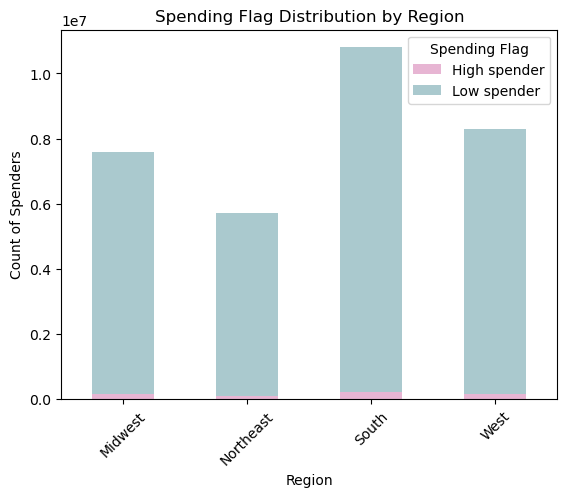

In [21]:
# Create stacked bar chart

df_spend_region_stacked_bar = df_spend_region.plot(kind='bar', stacked=True, color=['#E7B5D3','#AAC9CE'] )
plt.title('Spending Flag Distribution by Region')
plt.xlabel('Region')
plt.ylabel('Count of Spenders')
plt.xticks(rotation=45)
plt.legend(title='Spending Flag')
plt.show()

In [22]:
# Create count of avg_order_price

df_spend_region_1 = df_ords_prods_cust_merge.groupby(['region'])['avg_order_price'].mean()
df_spend_region_1.reset_index()

,region,avg_order_price
0,Midwest,12.664750
1,Northeast,11.514845
2,South,12.146962
3,West,11.271969


Text(0.5, 0, 'Region')

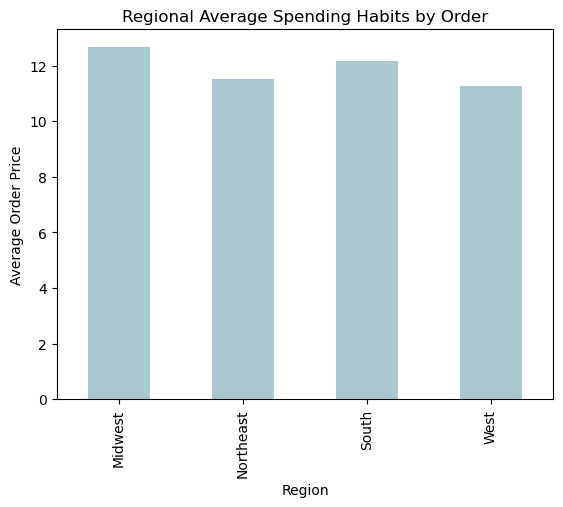

In [23]:
# Create bar chart of average spending habits

df_spend_region_bar = df_spend_region_1.plot(kind='bar', color= '#AAC9CE')
plt.title('Regional Average Spending Habits by Order')
plt.ylabel('Average Order Price')
plt.xlabel('Region')

After analyzing spending habits across different regions of the United States, no significant differences appear to exist. When examining the data by sorting spending flag categories from highest to lowest, a consistent trend emerges across all regions. Differences in total spending numbers seem to correlate more with population size rather than indicating distinct spending behaviors. For instance, while the Southern region records the highest counts of both high and low spenders, similar patterns are observed across all regions with varying totals. This lack of distinguishable patterns suggests a uniformity in spending habits across regions.

## Step 4 - Creating an Exclusion Flag for Low-Activity Customers

In [24]:
# Create an exclusion flag column

df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['max_order'] >= 5, 'exclusion_flag'] = 'Active'
df_ords_prods_cust_merge.loc[df_ords_prods_cust_merge['max_order'] < 5, 'exclusion_flag'] = 'Excluded'

In [25]:
# Check output

df_ords_prods_cust_merge['exclusion_flag'].value_counts()

exclusion_flag
Active      30988441
Excluded     1441342
Name: count, dtype: int64

In [26]:
# Create a dataframe with only active customers
df_active = df_ords_prods_cust_merge[df_ords_prods_cust_merge['exclusion_flag'] == 'Active']

In [27]:
# Check output

df_active.shape

(30988441, 32)

In [28]:
# Create dataframe with only excluded customers

df_inactive = df_ords_prods_cust_merge[df_ords_prods_cust_merge['exclusion_flag'] == 'Excluded']

In [29]:
# Check output

df_inactive.shape

(1441342, 32)

In [30]:
df_active.head(1)

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income,region,exclusion_flag
0,2539329,1,1,2,8,7.0,196.0,1.0,0.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Regularly busy,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423,South,Active


In [31]:
# Export the dataframes

df_active.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'ords_prods_active.pkl'))
df_inactive.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'ords_prods_inactive.pkl'))

## Step 5 - Creating Profiling Variables for Customers

In [32]:
# Create income profiles

df_active.loc[df_active['income'] < 50000, 'income_profile'] = 'Low Income'
df_active.loc[(df_active['income'] >= 50000) & (df_active['income'] < 100000), 'income_profile'] = 'Middle Income'
df_active.loc[df_active['income'] >= 100000, 'income_profile'] = 'High Income'

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\1997072249.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[df_active['income'] < 50000, 'income_profile'] = 'Low Income'


In [33]:
# Check ouput

df_active['income_profile'].value_counts(dropna = False)

income_profile
High Income      14215418
Middle Income    13406874
Low Income        3366149
Name: count, dtype: int64

In [34]:
# Create age profiles
df_active.loc[(df_active['age'] >= 18) & (df_active['age'] < 30), 'age_profile'] = 'Young Adult'
df_active.loc[(df_active['age'] >= 30) & (df_active['age'] < 45), 'age_profile'] = 'Adult'
df_active.loc[(df_active['age'] >= 45) & (df_active['age'] < 65), 'age_profile'] = 'Middle-aged'
df_active.loc[df_active['age'] >= 65 , 'age_profile'] = 'Senior'

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\3862325929.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[(df_active['age'] >= 18) & (df_active['age'] < 30), 'age_profile'] = 'Young Adult'


In [35]:
df_active['age_profile'].value_counts(dropna = False)

age_profile
Middle-aged    9697875
Senior         8201627
Adult          7266757
Young Adult    5822182
Name: count, dtype: int64

In [36]:
# Create conditions for family_dynamic_tag

young = (df_active['age_profile'] == 'Young Adult')
adult = df_active['age_profile'].isin(['Adult', 'Middle-aged', 'Senior'])
single = df_active['fam_status'].isin(['Single', 'Divorced/Widowed', 'Living with parents and siblings'])
married = (df_active['fam_status'] == 'Married')
kids = (df_active['number_of_dependants'] > 0)
no_kids = (df_active['number_of_dependants'] == 0)

In [37]:
# Define conditions for family_dynamic_tag

conditions = [
    (young & single & kids),
    (young & married & kids),
    (adult & single & kids),
    (adult & married & kids),
    (young & single & no_kids),
    (young & married & no_kids),
    (adult & single & no_kids),
    (adult & married & no_kids)
]

In [38]:
# Define categories

categories = [
    'Young Single Parent',
    'Young Married Parent',
    'Single Parent',
    'Married Parent',
    'Young Single Adult (No Kids)',
    'Young Married Adult (No Kids)',
    'Single Adult (No Kids)',
    'Married Adult (No Kids)'
]    

In [39]:
# Create family_dynamic_tag column

for condition, category in zip(conditions, categories):
    df_active.loc[condition, 'family_dynamic_tag'] = category

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\817854057.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[condition, 'family_dynamic_tag'] = category


In [40]:
# Check output

df_active.head(1)

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income,region,exclusion_flag,income_profile,age_profile,family_dynamic_tag
0,2539329,1,1,2,8,7.0,196.0,1.0,0.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Regularly busy,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423,South,Active,Low Income,Adult,Married Parent


In [41]:
# Check output

df_active['family_dynamic_tag'].value_counts(dropna = False)

family_dynamic_tag
Married Parent                  18869101
Single Adult (No Kids)           6297158
Young Married Parent             2890856
Young Single Parent              1482438
Young Single Adult (No Kids)     1448888
Name: count, dtype: int64

In [42]:
# Create a time_shopper_profile

df_active.loc[df_active['order_hour_of_day'] < 12, 'time_shopper_profile'] = 'Morning Shopper'
df_active.loc[(df_active['order_hour_of_day'] >= 12) & (df_active['order_hour_of_day'] < 18), 'time_shopper_profile'] = 'Afternoon Shopper'
df_active.loc[df_active['order_hour_of_day'] >= 18, 'time_shopper_profile'] = 'Evening Shopper'

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\1990853348.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[df_active['order_hour_of_day'] < 12, 'time_shopper_profile'] = 'Morning Shopper'


In [43]:
# Check output

df_active['time_shopper_profile'].value_counts(dropna = False)

time_shopper_profile
Afternoon Shopper    14545775
Morning Shopper      11008065
Evening Shopper       5434601
Name: count, dtype: int64

In [44]:
# Create a week_shopper_profile

df_active.loc[df_active['orders_day_of_week'].isin([1, 2, 3, 4, 5]), 'weekly_shopper_profile'] = 'Weekday Shopper'
df_active.loc[df_active['orders_day_of_week'].isin([0, 6]), 'weekly_shopper_profile'] = 'Weekend Shopper'

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\3662921685.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[df_active['orders_day_of_week'].isin([1, 2, 3, 4, 5]), 'weekly_shopper_profile'] = 'Weekday Shopper'


In [45]:
# Check output

df_active['weekly_shopper_profile'].value_counts(dropna = False)

weekly_shopper_profile
Weekday Shopper    20780938
Weekend Shopper    10207503
Name: count, dtype: int64

In [46]:
# Create department_shopper_profile

df_active.loc[df_active['department_id'] == 1, 'department_shopper_profile'] = 'Frozen Foods Shopper'
df_active.loc[df_active['department_id'] == 3, 'department_shopper_profile'] = 'Baked Goods Shopper'
df_active.loc[df_active['department_id'] == 4, 'department_shopper_profile'] = 'Fresh Produce Shopper'
df_active.loc[df_active['department_id'] == 5, 'department_shopper_profile'] = 'Alcohol Purchaser'
df_active.loc[df_active['department_id'] == 6, 'department_shopper_profile'] = 'International Foods Shopper'
df_active.loc[df_active['department_id'] == 7, 'department_shopper_profile'] = 'Beverage Purchaser'
df_active.loc[df_active['department_id'] == 8, 'department_shopper_profile'] = 'Pet Products Purchaser'
df_active.loc[df_active['department_id'].isin([9, 13, 15]), 'department_shopper_profile'] = 'Shelf-Stable Foods Shopper'
df_active.loc[df_active['department_id'] == 10, 'department_shopper_profile'] = 'Bulk Purchaser'
df_active.loc[df_active['department_id'].isin([11, 17]), 'department_shopper_profile'] = 'Home & Hygiene Products Shopper'
df_active.loc[df_active['department_id'].isin([12, 16]), 'department_shopper_profile'] = 'Animal-Sourced Foods Shopper'
df_active.loc[df_active['department_id'] == 14, 'department_shopper_profile'] = 'Breakfast Foods Shopper'
df_active.loc[df_active['department_id'] == 18, 'department_shopper_profile'] = 'Baby Products Purchaser'
df_active.loc[df_active['department_id'] == 19, 'department_shopper_profile'] = 'Snack Items Shopper'
df_active.loc[df_active['department_id'] == 20, 'department_shopper_profile'] = 'Deli Foods Shopper'
df_active.loc[~df_active['department_id'].isin([1, 3, 4, 5, 6, 7, 8, 9, 13, 15, 10, 11, 12, 16, 17, 14, 18, 19, 20]), 'department_shopper_profile'] = 'Other Goods Shopper'

C:\Users\jenci\AppData\Local\Temp\ipykernel_6868\2842001304.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_active.loc[df_active['department_id'] == 1, 'department_shopper_profile'] = 'Frozen Foods Shopper'


In [47]:
# Check output

df_active['department_shopper_profile'].value_counts(dropna = False)

department_shopper_profile
Fresh Produce Shopper              9079276
Animal-Sourced Foods Shopper       5862390
Shelf-Stable Foods Shopper         3617113
Snack Items Shopper                2766406
Beverage Purchaser                 2571934
Frozen Foods Shopper               2123342
Baked Goods Shopper                1125026
Home & Hygiene Products Shopper    1124273
Deli Foods Shopper                 1003834
Breakfast Foods Shopper             678095
Baby Products Purchaser             410392
International Foods Shopper         255991
Alcohol Purchaser                   144674
Other Goods Shopper                  99179
Pet Products Purchaser               93065
Bulk Purchaser                       33451
Name: count, dtype: int64

## Step 6 - Creating Visualizations Based on Customer Profiles

In [48]:
#Check dataframe
df_active.head(1)

,order_id,user_id,order_number,orders_day_of_week,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,busiest_day,busiest_days,busiest_period_of_day,max_order,loyalty_flag,avg_order_price,spending_flag,median_order_freq,order_freq_flag,gender,state,age,join_date,number_of_dependants,fam_status,income,region,exclusion_flag,income_profile,age_profile,family_dynamic_tag,time_shopper_profile,weekly_shopper_profile,department_shopper_profile
0,2539329,1,1,2,8,7.0,196.0,1.0,0.0,Soda,77,7,9.0,Mid-range product,Regularly busy,Regularly busy,Average orders,10,New customer,6.367797,Low spender,20.0,Regular customer,Female,Alabama,31,2/17/2019,3,Married,40423,South,Active,Low Income,Adult,Married Parent,Morning Shopper,Weekday Shopper,Beverage Purchaser


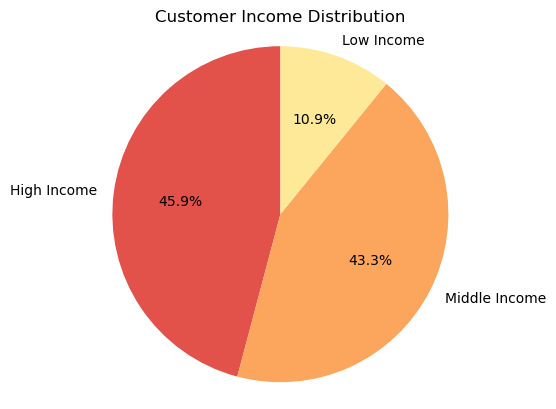

In [49]:
# Create customer income distributions pie chart

df_income_profile = df_active['income_profile'].value_counts()
with sns.color_palette('Spectral'):
    cust_income_profile_pie = df_income_profile.plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title('Customer Income Distribution')
    plt.axis('equal')
    plt.ylabel('')

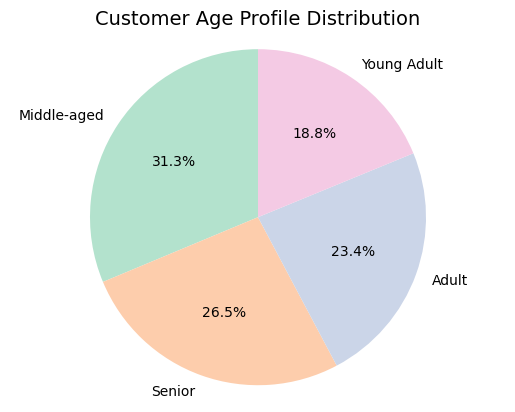

In [50]:
#Create customer age profile distributions pie chart

df_age_profile = df_active['age_profile'].value_counts()
with sns.color_palette('Pastel2'):
    cust_age_profile_pie = df_age_profile.plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title('Customer Age Profile Distribution', fontsize=14)
    plt.axis('equal')
    plt.ylabel('')

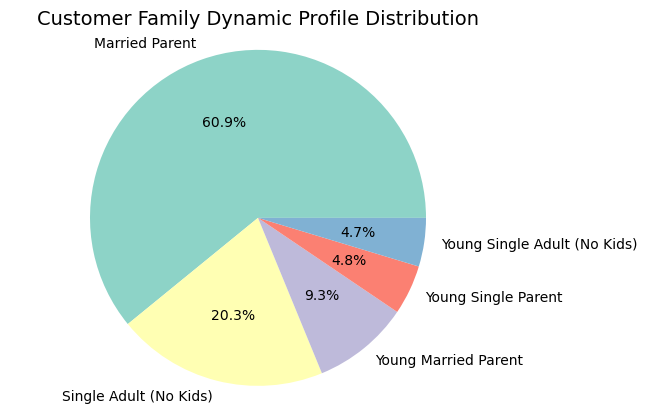

In [51]:
# Create family_dynamic_tag distributions pie chart

family_dynamic_profile = df_active['family_dynamic_tag'].value_counts()
with sns.color_palette('Set3'): 
    family_dynamic_pie = family_dynamic_profile.plot(kind='pie', autopct='%1.1f%%')
    plt.title('Customer Family Dynamic Profile Distribution', fontsize=14)
    plt.axis('equal')
    plt.ylabel('')

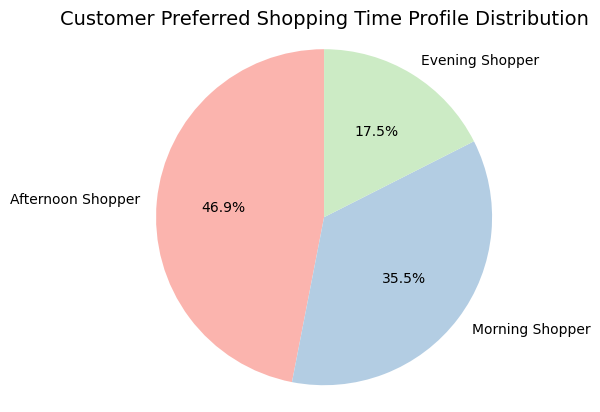

In [52]:
# Create time_shopper_profile distributions pie chart

df_time_shopper_profile = df_active['time_shopper_profile'].value_counts()
with sns.color_palette('Pastel1'): 
    time_shopper_pie = df_time_shopper_profile.plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title('Customer Preferred Shopping Time Profile Distribution', fontsize=14)
    plt.axis('equal')
    plt.ylabel('')

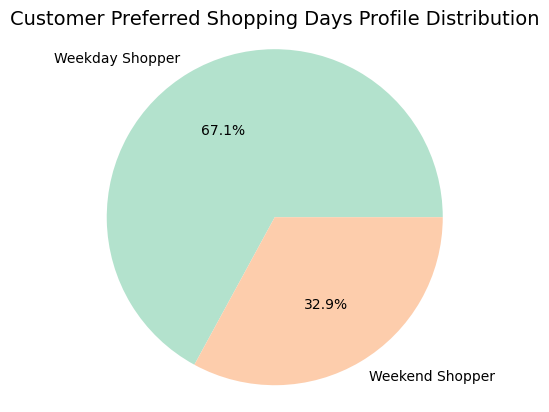

In [53]:
# Create weekly_shopper_profile distributions pie chart

df_weekly_shopper_profile = df_active['weekly_shopper_profile'].value_counts()
with sns.color_palette('Pastel2'): 
    weekly_shopper_pie = df_weekly_shopper_profile.plot(kind='pie', autopct='%1.1f%%')
    plt.title('Customer Preferred Shopping Days Profile Distribution', fontsize=14)
    plt.axis('equal')
    plt.ylabel('')

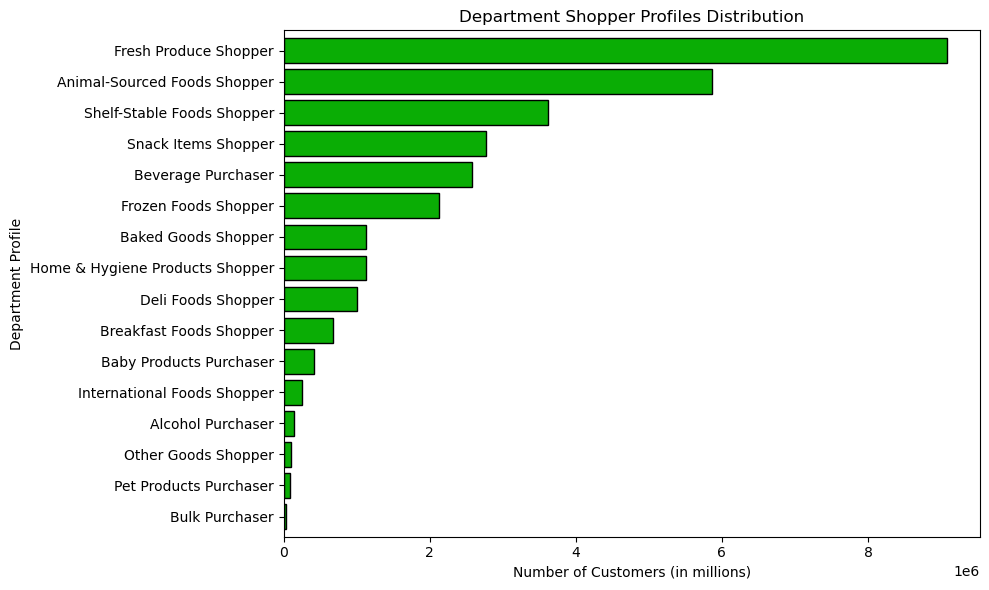

In [54]:
# Create department shopper profiles bar chart

order = df_active['department_shopper_profile'].unique()
df_department_profile=df_active['department_shopper_profile'].value_counts()
df_department_profile = df_department_profile.sort_values(ascending=True)

plt.figure(figsize=(10, 6))
department_shopper_bar =df_department_profile.plot(kind='barh', width=0.8, color='#0AAD05', edgecolor='black')
plt.title('Department Shopper Profiles Distribution')
plt.xlabel('Number of Customers (in millions)')
plt.ylabel('Department Profile')
labels = ['\n'.join(' '.join(label.split()[i:i+2]) for i in range(0, len(label.split()), 2)) for label in df_department_profile.index]
plt.tight_layout()
plt.show()

## Step 7 - Creating Aggregates of Variables at the Customer Profile level

In [55]:
# Aggregate age profiles

age_profile_agg = df_active.groupby('age_profile').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
age_profile_agg

order_number                prices                
                     min       mean max    min      mean   max
age_profile                                                   
Adult                  1  17.875589  99    1.0  7.796984  25.0
Middle-aged            1  17.862976  99    1.0  7.793988  25.0
Senior                 1  17.784141  99    1.0  7.801398  25.0
Young Adult            1  17.803740  99    1.0  7.787009  25.0

In [56]:
# Aggregate income profiles

income_profile_agg = df_active.groupby('income_profile').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
income_profile_agg

order_number                prices                
                        min       mean max    min      mean   max
income_profile                                                   
High Income               1  17.918309  99    1.0  7.957859  25.0
Low Income                1  16.835892  99    1.0  6.713149  25.0
Middle Income             1  17.995068  99    1.0  7.894734  25.0

In [57]:
# Aggregate family dynamic profile profiles

fam_dynamic_profile_agg = df_active.groupby('family_dynamic_tag').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
fam_dynamic_profile_agg

order_number                prices            \
                                      min       mean max    min      mean   
family_dynamic_tag                                                          
Married Parent                          1  17.778628  99    1.0  7.796756   
Single Adult (No Kids)                  1  18.027597  99    1.0  7.798804   
Young Married Parent                    1  17.776344  99    1.0  7.782960   
Young Single Adult (No Kids)            1  17.656743  99    1.0  7.775821   
Young Single Parent                     1  18.000836  99    1.0  7.805837   

                                    
                               max  
family_dynamic_tag                  
Married Parent                25.0  
Single Adult (No Kids)        25.0  
Young Married Parent          25.0  
Young Single Adult (No Kids)  25.0  
Young Single Parent           25.0

In [58]:
# Aggregating relationship between age_profile and family_dynamic_tag with average order frequency
order_freq_age_fam_dynamic_agg = pd.crosstab(index=df_active['age_profile'], columns=df_active['family_dynamic_tag'], values=df_active['days_since_prior_order'], aggfunc='mean')
order_freq_age_fam_dynamic_agg

family_dynamic_tag,Married Parent,Single Adult (No Kids),Young Married Parent,Young Single Adult (No Kids),Young Single Parent
age_profile,,,,,
Adult,10.597240,10.621393,NaN,NaN,NaN
Middle-aged,10.656200,10.512863,NaN,NaN,NaN
Senior,10.595037,10.566479,NaN,NaN,NaN
Young Adult,NaN,NaN,10.593169,10.705798,10.551854


In [59]:
# Aggregating the relationship between age_profile and family_dynamic_tag with average price
order_freq_age_fam_dynamic_agg = pd.crosstab(index=df_active['age_profile'], columns=df_active['family_dynamic_tag'], values=df_active['prices'], aggfunc='mean')
order_freq_age_fam_dynamic_agg

family_dynamic_tag,Married Parent,Single Adult (No Kids),Young Married Parent,Young Single Adult (No Kids),Young Single Parent
age_profile,,,,,
Adult,7.799004,7.790940,NaN,NaN,NaN
Middle-aged,7.792733,7.797695,NaN,NaN,NaN
Senior,7.799490,7.807221,NaN,NaN,NaN
Young Adult,NaN,NaN,7.78296,7.775821,7.805837


In [60]:
# Aggregate time shopper profile profiles

time_shopper_profile_agg = df_active.groupby('time_shopper_profile').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
time_shopper_profile_agg

order_number                prices                
                              min       mean max    min      mean   max
time_shopper_profile                                                   
Afternoon Shopper               1  17.382606  99    1.0  7.804464  25.0
Evening Shopper                 1  16.998038  99    1.0  7.808563  25.0
Morning Shopper                 1  18.842998  99    1.0  7.776757  25.0

In [61]:
# Aggregate weekly shopper profile profiles

weekly_shopper_profile_agg = df_active.groupby('weekly_shopper_profile').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
weekly_shopper_profile_agg

order_number                prices                
                                min       mean max    min      mean   max
weekly_shopper_profile                                                   
Weekday Shopper                   1  18.324240  99    1.0  7.762380  25.0
Weekend Shopper                   1  16.835761  99    1.0  7.862443  25.0

In [62]:
# Aggregate department shopper profiles

dept_shopper_profile_agg = df_active.groupby('department_shopper_profile').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max']})
dept_shopper_profile_agg

order_number                prices            \
                                         min       mean max    min      mean   
department_shopper_profile                                                     
Alcohol Purchaser                          1  16.031865  99    1.0  8.151446   
Animal-Sourced Foods Shopper               1  18.122843  99    1.0  9.268081   
Baby Products Purchaser                    1  19.867090  99    1.0  7.634399   
Baked Goods Shopper                        1  17.865992  99    1.0  7.868462   
Beverage Purchaser                         1  17.901457  99    1.0  7.682624   
Breakfast Foods Shopper                    1  17.453395  99    1.0  8.068044   
Bulk Purchaser                             1  20.797555  99    1.4  8.346919   
Deli Foods Shopper                         1  17.144802  99    1.0  7.783347   
Fresh Produce Shopper                      1  18.495724  99    1.0  7.980349   
Frozen Foods Shopper                       1  16.160536  99    1.0  7.738627   
Home & Hygiene Products Shopper            1  16.625692  99    1.0  7.613493   
International Foods Shopper                1  17.174694  99    1.0  7.678797   
Other Goods Shopper                        1  22.135442  99    1.0  8.071290   
Pet Products Purchaser                     1  15.996153  99    1.0  7.887860   
Shelf-Stable Foods Shopper                 1  17.059791  99    1.0  7.732637   
Snack Items Shopper                        1  17.830354  99    1.6  4.275555   

                                       
                                  max  
department_shopper_profile             
Alcohol Purchaser                15.0  
Animal-Sourced Foods Shopper     25.0  
Baby Products Purchaser          15.0  
Baked Goods Shopper              15.0  
Beverage Purchaser               15.0  
Breakfast Foods Shopper          14.9  
Bulk Purchaser                   14.1  
Deli Foods Shopper               15.0  
Fresh Produce Shopper            15.0  
Frozen Foods Shopper             15.0  
Home & Hygiene Products Shopper  15.0  
International Foods Shopper      15.0  
Other Goods Shopper              15.0  
Pet Products Purchaser           15.0  
Shelf-Stable Foods Shopper       20.0  
Snack Items Shopper               7.0

## Step 8 - Comparing Customer Profiles with Regions and Departments

In [63]:
# Aggreagte age profiles by region

region_age_agg = pd.crosstab(df_active['region'], df_active['age_profile'], normalize='columns')
region_age_agg

age_profile,Adult,Middle-aged,Senior,Young Adult
region,,,,
Midwest,0.236248,0.235933,0.232292,0.233027
Northeast,0.173275,0.175203,0.181196,0.176054
South,0.336950,0.329733,0.330483,0.337029
West,0.253527,0.259130,0.256028,0.253890


In [64]:
# Aggreagte income profiles by region

region_income_agg = pd.crosstab(df_active['region'], df_active['income_profile'], normalize='columns')
region_income_agg

income_profile,High Income,Low Income,Middle Income
region,,,
Midwest,0.239307,0.233061,0.229758
Northeast,0.177148,0.174636,0.176274
South,0.328262,0.339812,0.336302
West,0.255283,0.252492,0.257666


In [65]:
# Aggreagte family dynamic profiles by region

region_family_dynamic_agg = pd.crosstab(df_active['region'], df_active['family_dynamic_tag'], normalize='columns')
region_family_dynamic_agg

family_dynamic_tag,Married Parent,Single Adult (No Kids),Young Married Parent,Young Single Adult (No Kids),Young Single Parent
region,,,,,
Midwest,0.234020,0.237285,0.233503,0.227791,0.237216
Northeast,0.177720,0.173242,0.174180,0.182703,0.173209
South,0.332162,0.331760,0.332623,0.341547,0.341205
West,0.256097,0.257713,0.259694,0.247959,0.248371


In [66]:
# Aggreagte time_shopper profile by region

region_time_agg = pd.crosstab(df_active['region'], df_active['time_shopper_profile'], normalize='columns')
region_time_agg

time_shopper_profile,Afternoon Shopper,Evening Shopper,Morning Shopper
region,,,
Midwest,0.234182,0.236602,0.233875
Northeast,0.176718,0.176385,0.176260
South,0.331667,0.333651,0.334426
West,0.257433,0.253363,0.255439


In [67]:
# Aggreagte weekly_shopper profile by region

region_weekly_agg = pd.crosstab(df_active['region'], df_active['weekly_shopper_profile'], normalize='columns')
region_weekly_agg

weekly_shopper_profile,Weekday Shopper,Weekend Shopper
region,,
Midwest,0.234104,0.235298
Northeast,0.176790,0.175900
South,0.333545,0.331875
West,0.255561,0.256927


In [68]:
# Aggreagte department shopper profiles by region

region_dept_shopper_agg = df_active.groupby(['region', 'department_shopper_profile']).agg({'order_number':'count', 'prices':['min', 'mean', 'max']})
region_dept_shopper_agg_normalized = region_dept_shopper_agg.div(region_dept_shopper_agg.groupby(level='region').transform('sum'))

In [69]:
region_dept_shopper_agg

order_number prices                
                                                 count    min      mean   max
region    department_shopper_profile                                         
Midwest   Alcohol Purchaser                      34052    1.0  8.132588  15.0
          Animal-Sourced Foods Shopper         1373081    1.0  9.266424  25.0
          Baby Products Purchaser                95741    1.0  7.606518  15.0
          Baked Goods Shopper                   262614    1.0  7.873013  15.0
          Beverage Purchaser                    598990    1.0  7.685251  15.0
          Breakfast Foods Shopper               157781    1.0  8.058976  14.9
          Bulk Purchaser                          7929    1.4  8.443826  14.1
          Deli Foods Shopper                    234464    1.0  7.808128  15.0
          Fresh Produce Shopper                2134116    1.0  7.981817  15.0
          Frozen Foods Shopper                  498527    1.0  7.724649  15.0
          Home & Hygiene Products Shopper       267410    1.0  7.608723  15.0
          International Foods Shopper            60666    1.0  7.634708  15.0
          Other Goods Shopper                    23546    1.0  8.156608  15.0
          Pet Products Purchaser                 21358    1.0  7.816219  15.0
          Shelf-Stable Foods Shopper            851288    1.0  7.738821  20.0
          Snack Items Shopper                   645143    1.6  4.275715   7.0
Northeast Alcohol Purchaser                      25034    1.0  8.050052  15.0
          Animal-Sourced Foods Shopper         1035163    1.0  9.264907  25.0
          Baby Products Purchaser                72712    1.0  7.640340  15.0
          Baked Goods Shopper                   200136    1.0  7.877189  15.0
          Beverage Purchaser                    462931    1.0  7.685703  15.0
          Breakfast Foods Shopper               119327    1.0  8.057970  14.9
          Bulk Purchaser                          5599    1.4  8.230363  14.1
          Deli Foods Shopper                    178398    1.0  7.769181  15.0
          Fresh Produce Shopper                1593004    1.0  7.977581  15.0
          Frozen Foods Shopper                  370817    1.0  7.739880  15.0
          Home & Hygiene Products Shopper       199383    1.0  7.602437  15.0
          International Foods Shopper            44678    1.0  7.671550  15.0
          Other Goods Shopper                    17780    1.1  7.984303  15.0
          Pet Products Purchaser                 17734    1.1  7.936715  15.0
          Shelf-Stable Foods Shopper            633516    1.0  7.713526  20.0
          Snack Items Shopper                   493154    1.6  4.269636   7.0
South     Alcohol Purchaser                      48822    1.0  8.179028  15.0
          Animal-Sourced Foods Shopper         1950475    1.0  9.260917  25.0
          Baby Products Purchaser               139511    1.0  7.666152  15.0
          Baked Goods Shopper                   373055    1.0  7.861959  15.0
          Beverage Purchaser                    859435    1.0  7.690308  15.0
          Breakfast Foods Shopper               225539    1.0  8.074924  14.9
          Bulk Purchaser                         11180    1.4  8.391682  14.1
          Deli Foods Shopper                    333620    1.0  7.784080  15.0
          Fresh Produce Shopper                3027478    1.0  7.982604  15.0
          Frozen Foods Shopper                  710443    1.0  7.749754  15.0
          Home & Hygiene Products Shopper       372614    1.0  7.622898  15.0
          International Foods Shopper            84649    1.0  7.743519  15.0
          Other Goods Shopper                    33366    1.0  7.988614  15.0
          Pet Products Purchaser                 29912    1.0  7.848255  15.0
          Shelf-Stable Foods Shopper           1202113    1.0  7.740229  20.0
          Snack Items Shopper                   916780    1.6  4.274023   7.0
West      Alcohol Purchaser                      36766    1.0  8

In [70]:
region_dept_shopper_agg_normalized

order_number    prices            \
                                                 count       min      mean   
region    department_shopper_profile                                         
Midwest   Alcohol Purchaser                   0.004686  0.058824  0.065685   
          Animal-Sourced Foods Shopper        0.188955  0.058824  0.074843   
          Baby Products Purchaser             0.013175  0.058824  0.061436   
          Baked Goods Shopper                 0.036139  0.058824  0.063588   
          Beverage Purchaser                  0.082429  0.058824  0.062072   
          Breakfast Foods Shopper             0.021713  0.058824  0.065090   
          Bulk Purchaser                      0.001091  0.082353  0.068199   
          Deli Foods Shopper                  0.032266  0.058824  0.063064   
          Fresh Produce Shopper               0.293684  0.058824  0.064467   
          Frozen Foods Shopper                0.068604  0.058824  0.062390   
          Home & Hygiene Products Shopper     0.036799  0.058824  0.061454   
          International Foods Shopper         0.008348  0.058824  0.061664   
          Other Goods Shopper                 0.003240  0.058824  0.065879   
          Pet Products Purchaser              0.002939  0.058824  0.063130   
          Shelf-Stable Foods Shopper          0.117149  0.058824  0.062505   
          Snack Items Shopper                 0.088781  0.094118  0.034534   
Northeast Alcohol Purchaser                   0.004577  0.058140  0.065198   
          Animal-Sourced Foods Shopper        0.189266  0.058140  0.075037   
          Baby Products Purchaser             0.013294  0.058140  0.061879   
          Baked Goods Shopper                 0.036592  0.058140  0.063798   
          Beverage Purchaser                  0.084641  0.058140  0.062247   
          Breakfast Foods Shopper             0.021817  0.058140  0.065262   
          Bulk Purchaser                      0.001024  0.081395  0.066658   
          Deli Foods Shopper                  0.032618  0.058140  0.062923   
          Fresh Produce Shopper               0.291259  0.058140  0.064611   
          Frozen Foods Shopper                0.067799  0.058140  0.062686   
          Home & Hygiene Products Shopper     0.036454  0.058140  0.061572   
          International Foods Shopper         0.008169  0.058140  0.062132   
          Other Goods Shopper                 0.003251  0.063953  0.064665   
          Pet Products Purchaser              0.003242  0.063953  0.064280   
          Shelf-Stable Foods Shopper          0.115830  0.058140  0.062472   
          Snack Items Shopper                 0.090167  0.093023  0.034580   
South     Alcohol Purchaser                   0.004731  0.058824  0.066035   
          Animal-Sourced Foods Shopper        0.189018  0.058824  0.074770   
          Baby Products Purchaser             0.013520  0.058824  0.061894   
          Baked Goods Shopper                 0.036152  0.058824  0.063475   
          Beverage Purchaser                  0.083287  0.058824  0.062089   
          Breakfast Foods Shopper             0.021857  0.058824  0.065195   
          Bulk Purchaser                      0.001083  0.082353  0.067752   
          Deli Foods Shopper                  0.032331  0.058824  0.062846   
          Fresh Produce Shopper               0.293389  0.058824  0.064449   
          Frozen Foods Shopper                0.068848  0.058824  0.062569   
          Home & Hygiene Products Shopper     0.036110  0.058824  0.061545   
          International Foods Shopper         0.008203  0.058824  0.062519   
          Other Goods Shopper                 0.003233  0.058824  0.064498   
          Pet Products Purchaser              0.002899  0.058824  0.063364   
          Shelf-Stable Foods Shopper          0.116495  0.058824  0.062492   
          Snack Items Shopper                 0.088844  0.094118  0.034507   
West      Alcohol Purchaser                   0.004634  0.058824

<Figure size 1200x800 with 0 Axes>

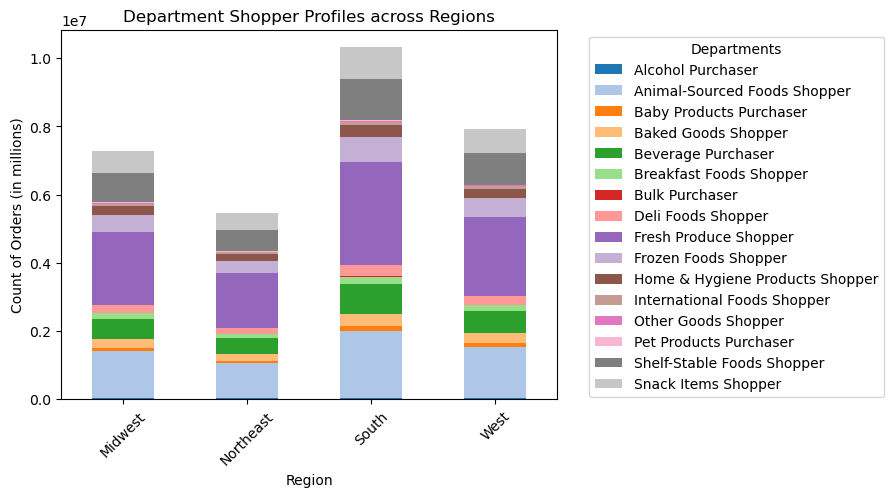

In [71]:
# Create department shopper profile distribution bar chart by region

df_region_dept_profile_crosstab = pd.crosstab(df_active['region'], df_active['department_shopper_profile'])
plt.figure(figsize=(12, 8))
color_map_1 = sns.color_palette("tab20")
df_region_dept_bar = df_region_dept_profile_crosstab.plot(kind='bar', stacked=True, color=color_map_1)
plt.title('Department Shopper Profiles across Regions')
plt.xlabel('Region')
plt.ylabel('Count of Orders (in millions)')
plt.xticks(rotation=45)
plt.legend(title='Departments', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

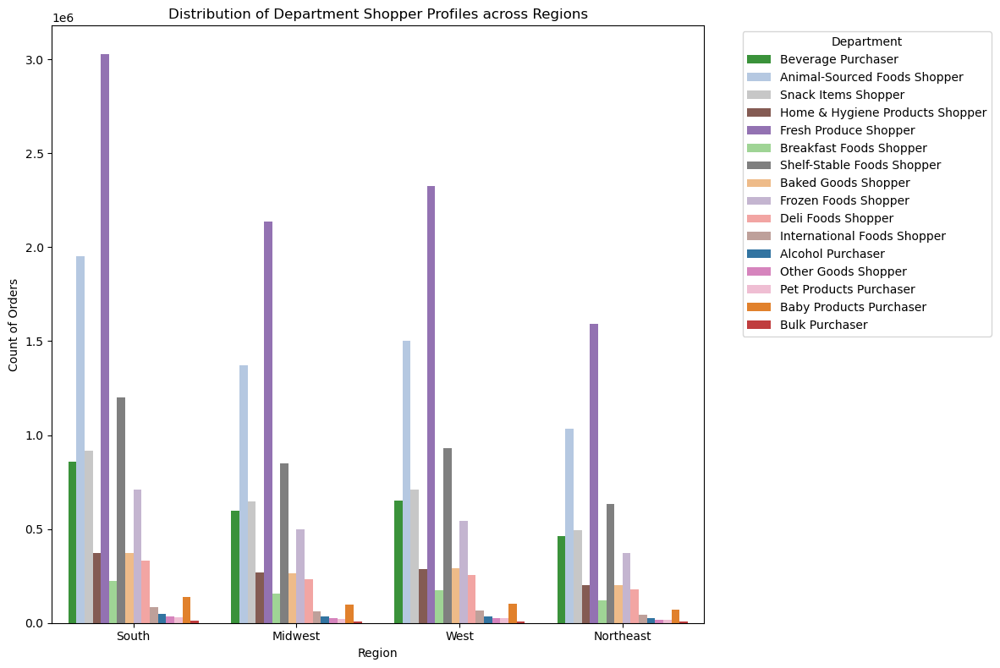

In [72]:
# Create unstacked version of bar chart
unique_values = sorted(df_active['department_shopper_profile'].unique())
palette = sns.color_palette("tab20", len(unique_values))
color_dict = dict(zip(unique_values, palette))
df_region_dept_unstacked_bar = plt.figure(figsize=(12, 8))
sns.countplot(data=df_active, x='region', hue='department_shopper_profile', palette=color_dict)
plt.title('Distribution of Department Shopper Profiles across Regions')
plt.xlabel('Region')
plt.ylabel('Count of Orders')
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

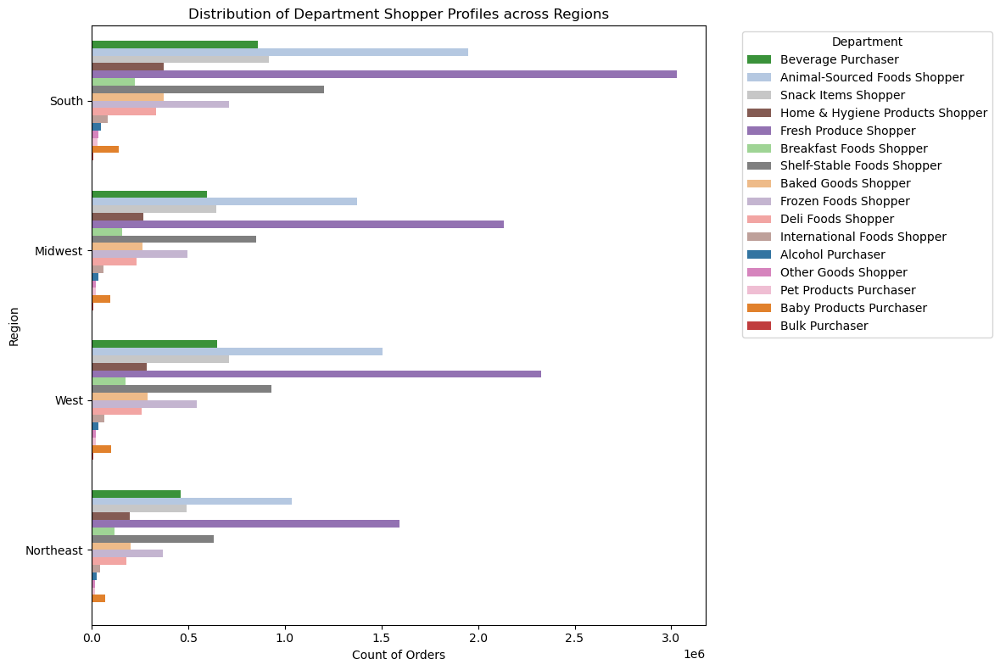

In [73]:
unique_values = sorted(df_active['department_shopper_profile'].unique())
palette = sns.color_palette("tab20", len(unique_values))
color_dict = dict(zip(unique_values, palette))
df_region_dept_unstacked_bar = plt.figure(figsize=(12, 8))

sns.countplot(data=df_active, y='region', hue='department_shopper_profile', palette=color_dict)
plt.title('Distribution of Department Shopper Profiles across Regions')
plt.xlabel('Count of Orders')  
plt.ylabel('Region')
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

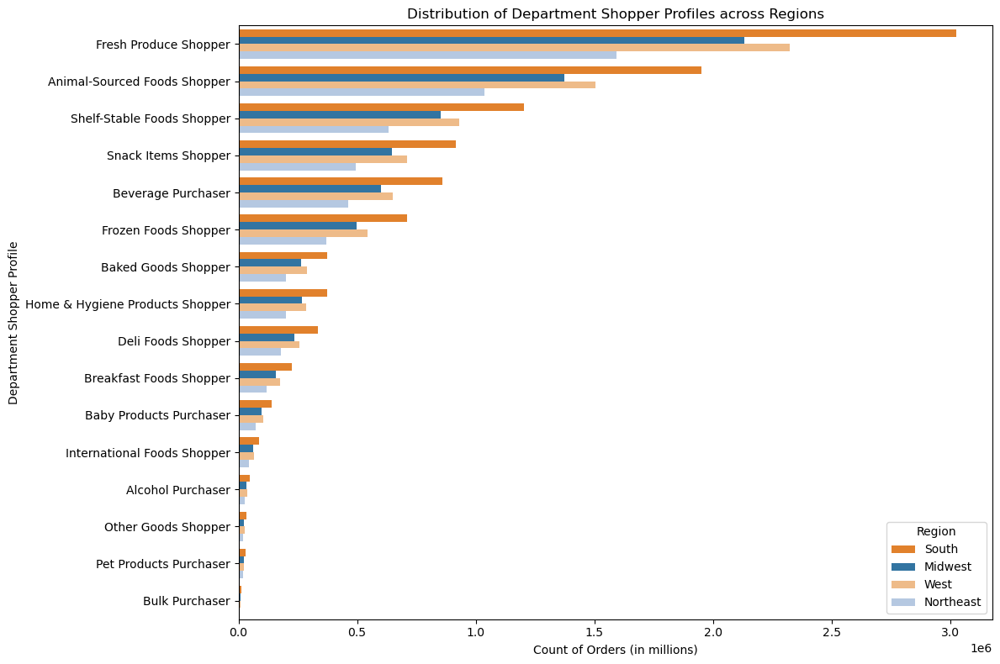

In [74]:
# Create bar chart of department shopper profiles distribution by region

unique_regions = sorted(df_active['region'].unique())
sorted_departments = df_active.groupby('department_shopper_profile').size().sort_values(ascending = False).index
palette = sns.color_palette("tab20", n_colors=len(unique_regions))
color_dict = dict(zip(unique_regions, palette))

df_dept_region_gropuped_bar =plt.figure(figsize=(12, 8))
sns.countplot(data=df_active, y='department_shopper_profile', hue='region', palette=color_dict, order=sorted_departments)
plt.title('Distribution of Department Shopper Profiles across Regions')
plt.xlabel('Count of Orders (in millions)')
plt.ylabel('Department Shopper Profile')
plt.legend(title='Region')
plt.tight_layout()
plt.show()

## Step 9 - Creating Visualizations of Analysis Results

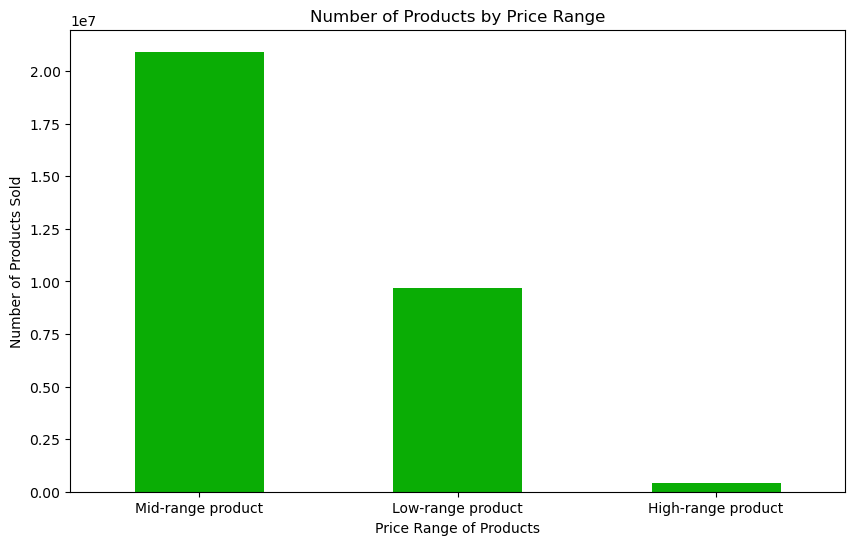

In [75]:
# Create bar chart of price range groupings distribution

df_price_range_product_distribution = df_active['price_range_loc'].value_counts()
order_2 = df_active['price_range_loc'].unique()
   
price_range_distribution_bar = plt.figure(figsize=(10, 6))
df_price_range_product_distribution.plot(kind='bar', color=['#0AAD05'])
plt.title('Number of Products by Price Range')
plt.xlabel('Price Range of Products')
plt.ylabel('Number of Products Sold (in millions)')
plt.xticks(rotation=0)
price_range_bar = plt.gcf()
plt.show()

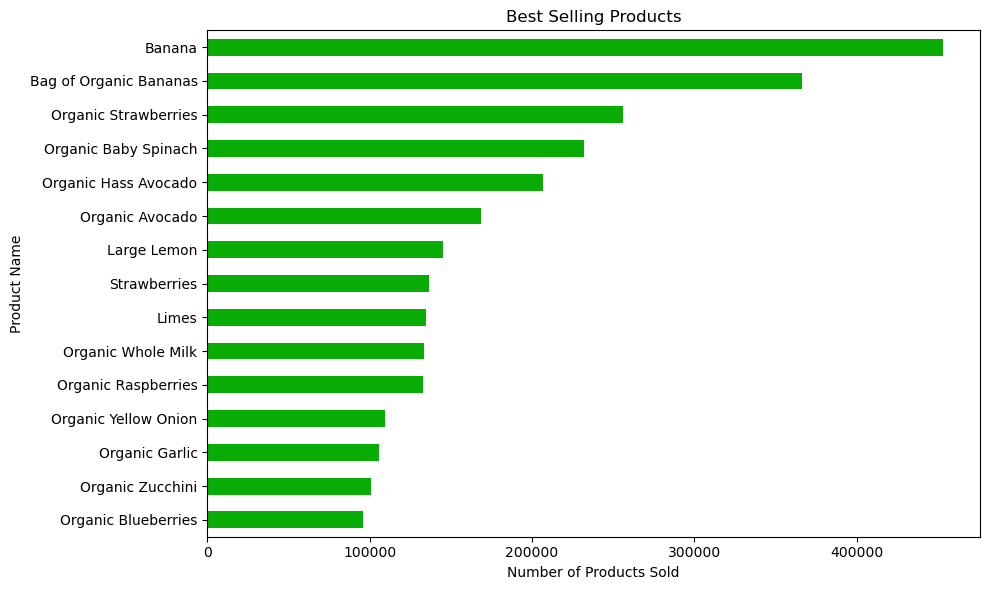

In [76]:
# Find most popular products

df_product_distribution = df_active['product_name'].value_counts()
df_top_selling_products = df_product_distribution.head(15)
df_top_selling_products = df_top_selling_products.sort_values(ascending=True)

top_selling_products_bar = plt.figure(figsize=(10, 6))
df_top_selling_products.plot(kind='barh', color='#0AAD05')
plt.title('Best Selling Products')
plt.xlabel('Number of Products Sold')
plt.ylabel('Product Name')
plt.tight_layout()
plt.show()

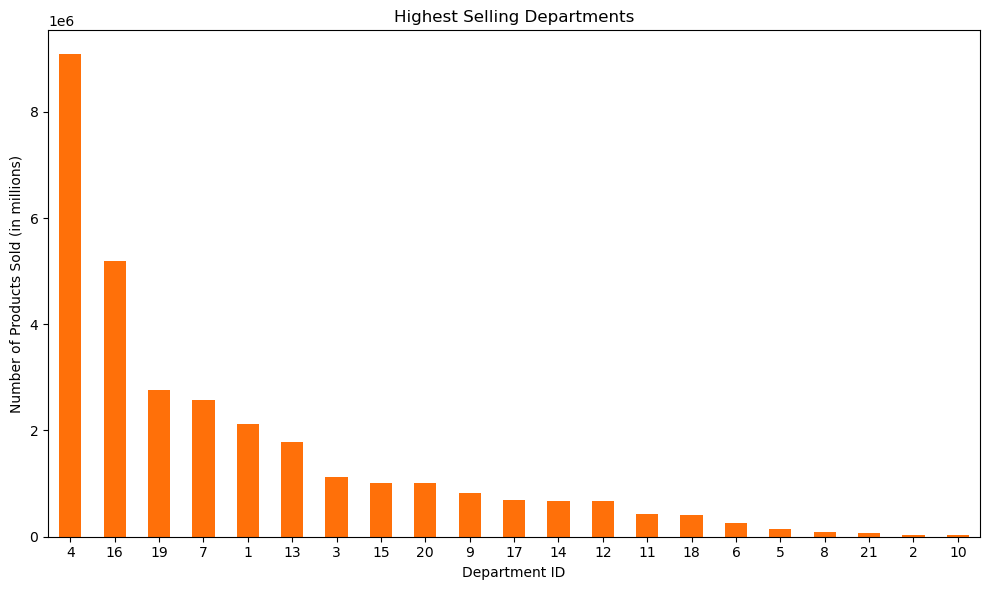

In [77]:
# Find which departments have the highest frequency of orders

df_dept_order_distribution = df_active['department_id'].value_counts()
highest_selling_depts_bar = plt.figure(figsize=(10, 6))
df_dept_order_distribution.plot(kind='bar', color='#FF7009')
plt.title('Highest Selling Departments')
plt.xlabel('Department ID')
plt.ylabel('Number of Products Sold (in millions)')
plt.xticks(rotation=0, ha='center')
plt.tight_layout()
plt.show()

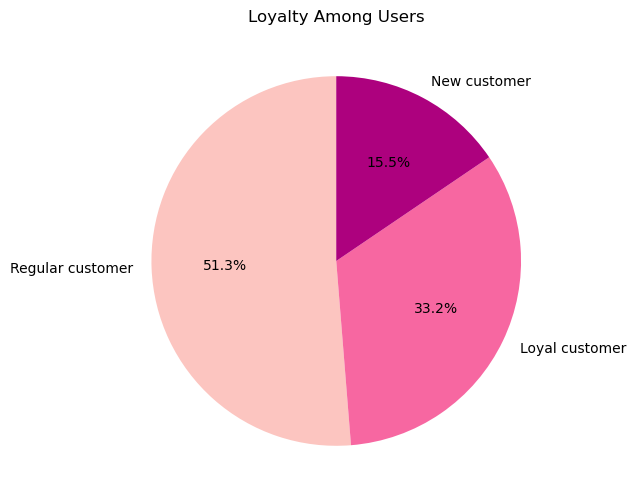

In [78]:
# Create pie chart showcasing distribution of brand loyalty among users

df_loyalty_distribution = df_active['loyalty_flag'].value_counts()
order_3 = df_active['loyalty_flag'].unique()
color_map_3 = sns.color_palette('RdPu', n_colors=len(order_3))
loyal_cust_distribution_pie = plt.figure(figsize=(10, 6))
df_loyalty_distribution.plot(kind='pie', colors=color_map_3, autopct='%1.1f%%', startangle=90)
plt.title('Loyalty Among Users')
plt.ylabel('') 
plt.show()

In [79]:
# Finding differences in ordering habits based on loyalty status

df_loyalty_orders_agg = df_active.groupby('loyalty_flag').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max'], 'median_order_freq':['min', 'mean', 'max']})
df_loyalty_orders_agg

order_number                prices                  \
                          min       mean max    min      mean   max   
loyalty_flag                                                          
Loyal customer              1  32.639745  99    1.0  7.778446  25.0   
New customer                1   4.268236  10    1.0  7.806156  25.0   
Regular customer            1  12.347272  40    1.0  7.803013  25.0   

                 median_order_freq                   
                               min       mean   max  
loyalty_flag                                         
Loyal customer                 0.0   5.214364  14.0  
New customer                   0.0  16.148402  30.0  
Regular customer               0.0  10.154995  30.0

In [80]:
# Finding differences in ordering habits based on region

df_region_orders_agg = df_active.groupby('region').agg({'order_number': ['min', 'mean', 'max'], 'prices': ['min', 'mean', 'max'], 'median_order_freq':['min', 'mean', 'max']})
df_region_orders_agg

order_number                prices                  \
                   min       mean max    min      mean   max   
region                                                         
Midwest              1  17.602753  99    1.0  7.796822  25.0   
Northeast            1  17.922045  99    1.0  7.786592  25.0   
South                1  17.843669  99    1.0  7.799144  25.0   
West                 1  17.972301  99    1.0  7.795068  25.0   

          median_order_freq                  
                        min      mean   max  
region                                       
Midwest                 0.0  9.505981  30.0  
Northeast               0.0  9.420788  30.0  
South                   0.0  9.440967  30.0  
West                    0.0  9.406191  30.0

In [81]:
# Finding differences in ordering habits based on age, income, and family profile with average order number
df_age_income_family_orders_pivot = pd.pivot_table(df_active, values='order_number', index=['age_profile','income_profile', 'family_dynamic_tag'], aggfunc='mean')
df_age_income_family_orders_pivot

order_number
age_profile income_profile family_dynamic_tag                        
Adult       High Income    Married Parent                   18.046284
                           Single Adult (No Kids)           17.646091
            Low Income     Married Parent                   16.768441
                           Single Adult (No Kids)           16.914940
            Middle Income  Married Parent                   18.072886
                           Single Adult (No Kids)           18.072672
Middle-aged High Income    Married Parent                   17.775934
                           Single Adult (No Kids)           18.548131
            Low Income     Married Parent                   16.581557
                           Single Adult (No Kids)           18.062327
            Middle Income  Married Parent                   17.897512
                           Single Adult (No Kids)           17.738925
Senior      High Income    Married Parent                   17.790201
                           Single Adult (No Kids)           17.948729
            Low Income     Married Parent                   17.322318
                           Single Adult (No Kids)           16.337493
            Middle Income  Married Parent                   17.866083
                           Single Adult (No Kids)           17.999987
Young Adult High Income    Young Married Parent             18.262140
                           Young Single Adult (No Kids)     19.068858
                           Young Single Parent              18.141013
            Low Income     Young Married Parent             16.496083
                           Young Single Adult (No Kids)     17.499664
                           Young Single Parent              15.694346
            Middle Income  Young Married Parent             17.997441
                           Young Single Adult (No Kids)     17.629677
                           Young Single Parent              18.414841

In [82]:
# Finding differences in ordering habits based on age, income, and family profile with average prices

df_age_income_family_prices_pivot = pd.pivot_table(df_active, values='prices', index=['age_profile','income_profile', 'family_dynamic_tag'], aggfunc='mean')
df_age_income_family_prices_pivot

prices
age_profile income_profile family_dynamic_tag                    
Adult       High Income    Married Parent                7.966704
                           Single Adult (No Kids)        7.933041
            Low Income     Married Parent                6.847671
                           Single Adult (No Kids)        6.842854
            Middle Income  Married Parent                7.940487
                           Single Adult (No Kids)        7.941783
Middle-aged High Income    Married Parent                7.958624
                           Single Adult (No Kids)        7.956757
            Low Income     Married Parent                6.506253
                           Single Adult (No Kids)        6.525589
            Middle Income  Married Parent                7.757239
                           Single Adult (No Kids)        7.775569
Senior      High Income    Married Parent                7.960030
                           Single Adult (No Kids)        7.958841
            Low Income     Married Parent                6.513877
                           Single Adult (No Kids)        6.514848
            Middle Income  Married Parent                7.779060
                           Single Adult (No Kids)        7.777172
Young Adult High Income    Young Married Parent          7.813084
                           Young Single Adult (No Kids)  7.960561
                           Young Single Parent           7.939448
            Low Income     Young Married Parent          6.895659
                           Young Single Adult (No Kids)  6.899892
                           Young Single Parent           6.905998
            Middle Income  Young Married Parent          7.947673
                           Young Single Adult (No Kids)  7.947633
                           Young Single Parent           7.964273

In [83]:
# Finding differences in ordering habits based on age, income, and family profile with order frequency

df_age_income_family_order_freq_pivot = pd.pivot_table(df_active, values='days_since_prior_order', index=['age_profile','income_profile', 'family_dynamic_tag'], aggfunc='mean')
df_age_income_family_order_freq_pivot

days_since_prior_order
age_profile income_profile family_dynamic_tag                                  
Adult       High Income    Married Parent                             10.510989
                           Single Adult (No Kids)                     10.587250
            Low Income     Married Parent                             11.005980
                           Single Adult (No Kids)                     11.021298
            Middle Income  Married Parent                             10.541040
                           Single Adult (No Kids)                     10.549621
Middle-aged High Income    Married Parent                             10.640336
                           Single Adult (No Kids)                     10.452950
            Low Income     Married Parent                             10.994459
                           Single Adult (No Kids)                     10.584108
            Middle Income  Married Parent                             10.578615
                           Single Adult (No Kids)                     10.682138
Senior      High Income    Married Parent                             10.565015
                           Single Adult (No Kids)                     10.523987
            Low Income     Married Parent                             10.753183
                           Single Adult (No Kids)                     11.049870
            Middle Income  Married Parent                             10.630839
                           Single Adult (No Kids)                     10.532430
Young Adult High Income    Young Married Parent                       10.668269
                           Young Single Adult (No Kids)               10.091558
                           Young Single Parent                        10.495001
            Low Income     Young Married Parent                       10.967084
                           Young Single Adult (No Kids)               10.860988
                           Young Single Parent                        11.113932
            Middle Income  Young Married Parent                       10.520471
                           Young Single Adult (No Kids)               10.699764
                           Young Single Parent                        10.451849

In [84]:
# Finding differences in ordering habits based on age, income, family, and department profile with prices

spec_department_categories = ['Fresh Produce Shopper', 'Animal-Sourced Foods Shopper', 'Bulk Purchaser', 'Baby Products Purchaser', 'Pet Products Purchaser']
df_dept_filtered = df_active[df_active['department_shopper_profile'].isin(spec_department_categories)]
df_age_income_family_dept_prices_pivot = pd.pivot_table(df_dept_filtered, values='prices', index=['age_profile', 'income_profile', 'family_dynamic_tag', 'department_shopper_profile'], aggfunc='mean')
pd.set_option('display.max_rows', None)
df_age_income_family_dept_prices_pivot

prices
age_profile income_profile family_dynamic_tag           department_shopper_profile            
Adult       High Income    Married Parent               Animal-Sourced Foods Shopper  9.487688
                                                        Baby Products Purchaser       7.717168
                                                        Bulk Purchaser                8.919184
                                                        Fresh Produce Shopper         8.086806
                                                        Pet Products Purchaser        8.081850
                           Single Adult (No Kids)       Animal-Sourced Foods Shopper  9.413582
                                                        Baby Products Purchaser       7.749847
                                                        Bulk Purchaser                7.848529
                                                        Fresh Produce Shopper         8.070994
                                                        Pet Products Purchaser        8.036221
            Low Income     Married Parent               Animal-Sourced Foods Shopper  7.986569
                                                        Baby Products Purchaser       7.283483
                                                        Bulk Purchaser                7.465059
                                                        Fresh Produce Shopper         7.276449
                                                        Pet Products Purchaser        6.797918
                           Single Adult (No Kids)       Animal-Sourced Foods Shopper  7.996183
                                                        Baby Products Purchaser       6.905700
                                                        Bulk Purchaser                8.090549
                                                        Fresh Produce Shopper         7.297956
                                                        Pet Products Purchaser        6.987397
            Middle Income  Married Parent               Animal-Sourced Foods Shopper  9.410578
                                                        Baby Products Purchaser       7.700756
                                                        Bulk Purchaser                8.549396
                                                        Fresh Produce Shopper         8.061737
                                                        Pet Products Purchaser        8.036966
                           Single Adult (No Kids)       Animal-Sourced Foods Shopper  9.392688
                                                        Baby Products Purchaser       7.713245
                                                        Bulk Purchaser                8.373727
                                                        Fresh Produce Shopper         8.072838
                                                        Pet Products Purchaser        8.009209
Middle-aged High Income    Married Parent               Animal-Sourced Foods Shopper  9.442331
                                                        Baby Products Purchaser       7.678764
                                                        Bulk Purchaser                8.492587
                                                        Fresh Produce Shopper         8.079589
                                                        Pet Products Purchaser        7.912029
                           Single Adult (No Kids)       Animal-Sourced Foods Shopper  9.449290
                                                        Baby Products Purchaser       7.468357
                                                        Bulk Purchaser                8.670191
                                                        Fresh Produce Shopper         8.080696
                                                        Pet Products Purchaser        8.024506
            Low Income     Married Parent               Animal-Sourced Foods Shopper  7.544464
   

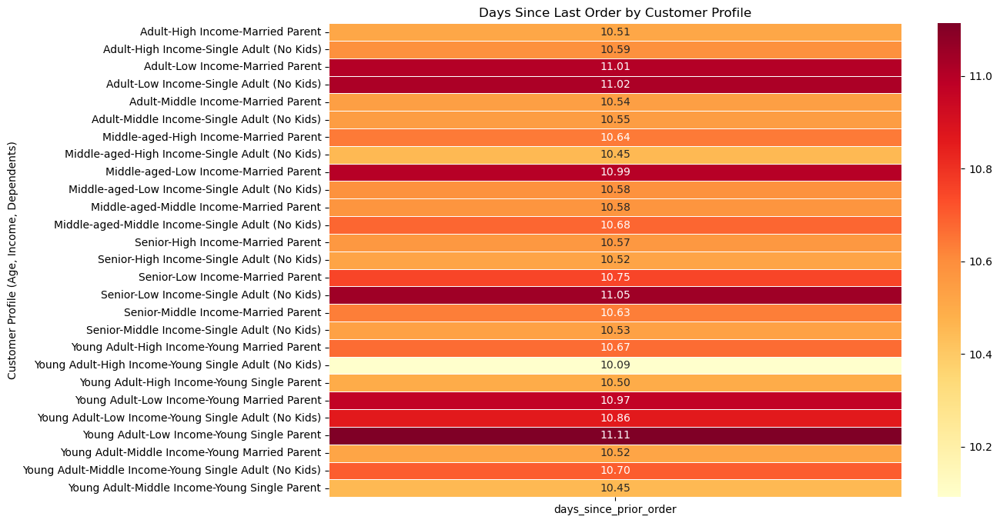

In [85]:
# Create heatmap of the order frequency cross-tabulation

plt.figure(figsize=(12, 8))
sns.heatmap(df_age_income_family_order_freq_pivot, annot=True, fmt=".2f", cmap='YlOrRd', linewidths=.5)
plt.title('Days Since Last Order by Customer Profile')
plt.ylabel('Customer Profile (Age, Income, Dependents)')
age_income_fam_order_freq_heatmap = plt.gcf()
plt.show()

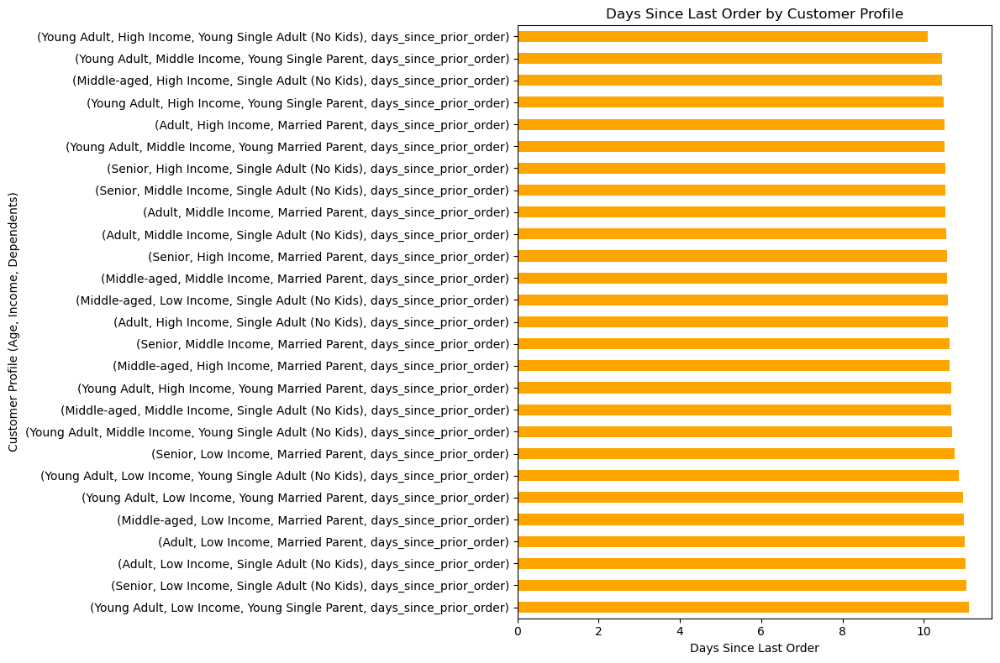

In [86]:
# Create barchart of the order frequency pivot table
data_1 = df_age_income_family_order_freq_pivot.stack().sort_values(ascending=False)

age_income_fam_order_freq_bargraph=plt.figure(figsize=(12, 8))
data_1.plot(kind='barh', color='orange')
plt.title('Days Since Last Order by Customer Profile')
plt.xlabel('Days Since Last Order')
plt.ylabel('Customer Profile (Age, Income, Dependents)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

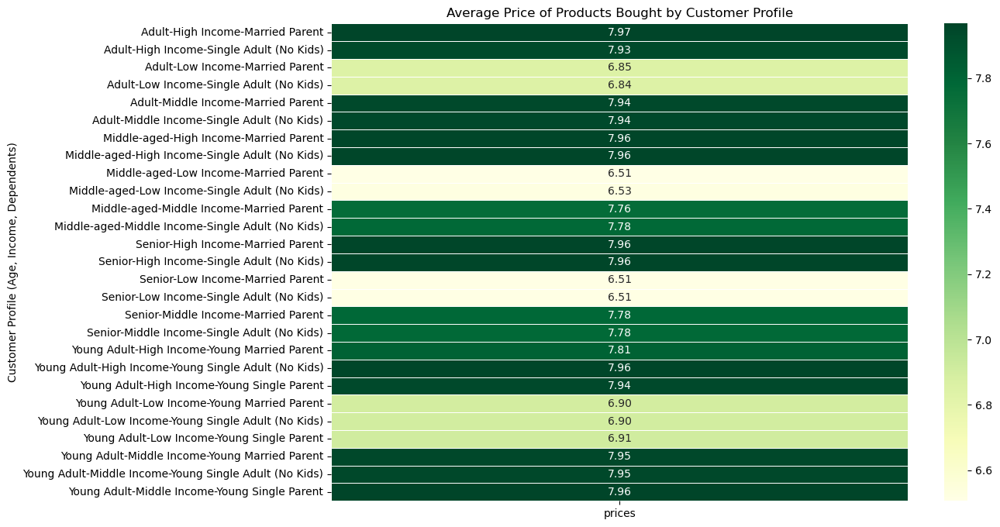

In [87]:
# Create heatmap of the prices cross-tabulation

plt.figure(figsize=(12, 8))
sns.heatmap(df_age_income_family_prices_pivot, annot=True, fmt=".2f", cmap='YlGn', linewidths=.5)
plt.title('Average Price of Products Bought by Customer Profile')
plt.ylabel('Customer Profile (Age, Income, Dependents)')
age_income_fam_prices_heatmap = plt.gcf()
plt.show()

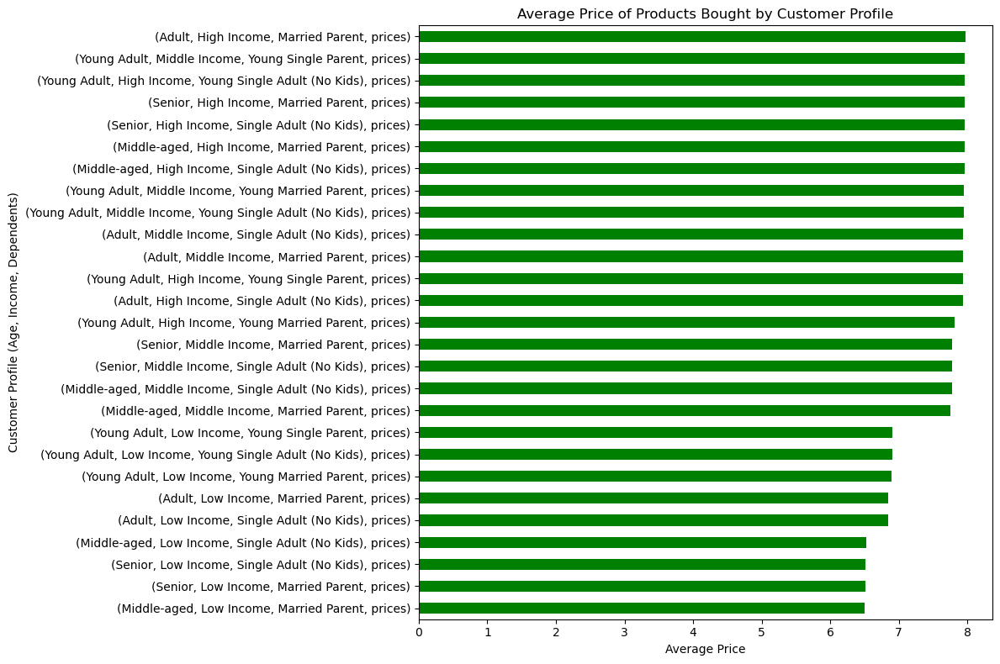

In [88]:
# Create barchart of the prices pivot table
data_2 = df_age_income_family_prices_pivot.stack().sort_values(ascending = True)

age_income_fam_prices_bargraph=plt.figure(figsize=(12, 8))
data_2.plot(kind='barh', color='green')
plt.title('Average Price of Products Bought by Customer Profile')
plt.xlabel('Average Price')
plt.ylabel('Customer Profile (Age, Income, Dependents)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

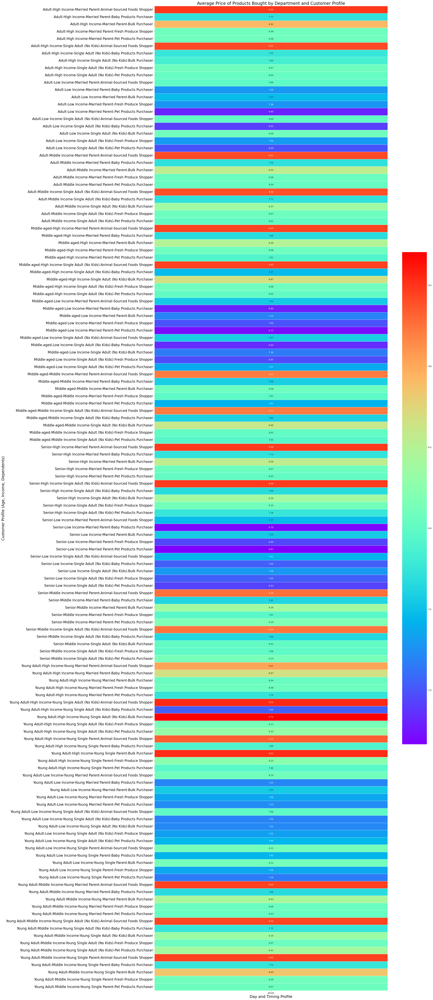

In [89]:
# Create heatmap of the department prices cross-tabulation

plt.figure(figsize=(25, 85))
sns.heatmap(df_age_income_family_dept_prices_pivot, annot=True, fmt=".2f", cmap='rainbow', linewidths=.5, cbar_kws={'shrink': 0.5})
plt.title('Average Price of Products Bought by Department and Customer Profile', fontsize=20)
plt.xlabel('Day and Timing Profile', fontsize=18)
plt.ylabel('Customer Profile (Age, Income, Dependents)', fontsize=18)
plt.yticks(fontsize=16)
age_income_fam_dept_prices_heatmap = plt.gcf()
plt.show()

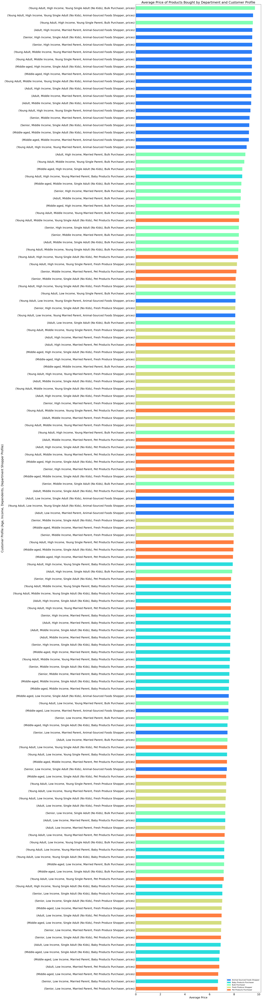

In [90]:
# Create bar chart of department prices pivot table
unique_profiles = sorted(df_age_income_family_dept_prices_pivot.index.get_level_values('department_shopper_profile').unique())
color_palette = sns.color_palette("rainbow", n_colors=len(unique_profiles))
color_dict = {profile: color for profile, color in zip(unique_profiles, color_palette)}
data_3 = df_age_income_family_dept_prices_pivot.stack().sort_values(ascending=True)


age_income_fam_dept_prices_bargraph=plt.figure(figsize=(25, 95))
data_3.plot(kind='barh', color=[color_dict.get(dep[3], '#7CA1D9') for dep in data_3.index])
plt.title('Average Price of Products Bought by Department and Customer Profile', fontsize=22)
plt.xlabel('Average Price', fontsize=18)
plt.ylabel('Customer Profile (Age, Income, Dependents, Department Shopper Profile)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
legend_labels = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in unique_profiles]
plt.legend(legend_labels, unique_profiles, loc='lower right', fontsize='large')
plt.show()

## Exporting Visualizations

In [91]:
df_spend_region_stacked_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'spending_by_region_stacked_bargraph.png'))

In [92]:
df_spend_region_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'spending_by_region_bargraph.png'))

In [93]:
cust_income_profile_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'customer_income_profile_piechart.png'))

In [94]:
cust_age_profile_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'customer_age_profile_piechart.png'))

In [95]:
family_dynamic_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'family_dynamic_piechart.png'))

In [96]:
time_shopper_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'time_shopper_piechart.png'))

In [97]:
weekly_shopper_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'weekle_shopper_piechart.png'))

In [98]:
department_shopper_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'department_shopper_bargraph.png'))

In [99]:
df_region_dept_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'department_shopper_profiles_by_region_stackedbargraph.png'),bbox_inches='tight')


In [100]:
df_dept_region_gropuped_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'department_shopper_profiles_by_region_unstackedbargraph.png'),bbox_inches='tight')

In [101]:
price_range_distribution_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'products_by_price_range_distribution_barchart.png'))

In [102]:
top_selling_products_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'top_selling_products_bargraph.png'))

In [103]:
highest_selling_depts_bar.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'highest_selling_departments_bargraph.png'))

In [104]:
loyal_cust_distribution_pie.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'loyal_customer_distribution_bargraph.png'))

In [105]:
age_income_fam_order_freq_heatmap.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_order_frequency_by_customer_profile_heatmap.png'))

In [106]:
age_income_fam_order_freq_bargraph.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_order_frequency_by_customer_profile_bargraph.png'),bbox_inches='tight')

In [107]:
age_income_fam_prices_heatmap.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_price_of_products_by_customer_profile_heatmap.png'))

In [108]:
age_income_fam_prices_bargraph.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_price_of_products_by_customer_profile_bargraph.png'),bbox_inches='tight')

In [109]:
age_income_fam_dept_prices_heatmap.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_spent_by_dept_and_customer_profile_heatmap.png'))

In [110]:
age_income_fam_dept_prices_bargraph.figure.savefig(os.path.join(path, '04 Analysis', 'Visualizations', 'average_spent_by_dept_and_customer_profile_bargraph.png'),bbox_inches='tight')

## Step 10 - Exporting the Final Dataset

In [111]:
# Export the final dataset

df_active.to_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'final_4_10_dataset.pkl'))